# Sentinel-2 Time Series

In [1]:
from pcxarray import pc_query, prepare_timeseries
from pcxarray.utils import load_census_shapefile
from distributed import Client # dask distributed client
import matplotlib.pyplot as plt
from IPython.display import HTML
from matplotlib.animation import FuncAnimation

In [2]:
client = Client(processes=True)
print(f"Dask client dashboard: {client.dashboard_link}")

Dask client dashboard: http://127.0.0.1:8787/status


In [3]:
okt_gdf = load_census_shapefile(level="county", verify=False)
okt_gdf = okt_gdf[okt_gdf['NAME'] == "Oktibbeha"]
okt_gdf = okt_gdf.to_crs("EPSG:32616") # UTM zone 16N

selected_geom = okt_gdf.geometry.union_all()

In [4]:
items_gdf = pc_query(
    collections=["sentinel-2-l2a"],
    geometry=selected_geom,
    datetime='2024', # grab all of 2024
    crs=okt_gdf.crs,
    # query={"eo:cloud_cover": {"lt": 50}} # OPTIONAL: filter by cloud cover
)
print(f"Found {len(items_gdf)} items in the query.")

Found 548 items in the query.


In [5]:
da = prepare_timeseries(
    items_gdf=items_gdf,
    geometry=selected_geom,
    crs=okt_gdf.crs,
    bands=["B02", "B04", "B08", "SCL"], # Blue, Red, NIR, Scene Classification Layer
    chunks={"time": 16, "x": 2048 , "y": 2048 }, 
    max_workers=-1, # use 8 workers to submit 
)
display(da)

Constructing dask computation graph:   0%|          | 0/134 [00:00<?, ?timestep/s]

Constructing dask computation graph: 100%|██████████| 134/134 [00:21<00:00,  6.25timestep/s]


<xarray.DataArray 'reproject-dbd79c696dd74ace8557a2a62da24a95' (time: 134,
                                                                band: 4,
                                                                y: 3128, x: 3932)> Size: 26GB
dask.array<rechunk-merge, shape=(134, 4, 3128, 3932), dtype=float32, chunksize=(16, 1, 2048, 2048), chunktype=numpy.ndarray>
Coordinates:
  * time         (time) datetime64[ns] 1kB 2024-01-02 2024-01-05 ... 2024-12-30
    spatial_ref  int32 4B 32616
  * band         (band) <U3 48B 'B02' 'B04' 'B08' 'SCL'
  * y            (y) float64 25kB 3.716e+06 3.716e+06 ... 3.684e+06 3.684e+06
  * x            (x) float64 31kB 3.055e+05 3.055e+05 ... 3.448e+05 3.448e+05
Attributes:
    AREA_OR_POINT:  Area
    scale_factor:   1.0
    add_offset:     0.0
    _FillValue:     nan

In [6]:
def calculate_evi(da):
    nir = da.sel(band="B08") / 10000
    red = da.sel(band="B04") / 10000
    blue = da.sel(band="B02") / 10000
    
    evi = 2.5 * (nir - red) / (nir + (6 * red) - (7.5 * blue) + 1)
    evi = evi.clip(-1, 1)  # Clip values to [-1, 1]
    return evi

da = da.where(~da.sel(band="SCL").isin([0, 3, 8, 9, 10, 11])) # mask out clouds, shadows, and snow
evi = calculate_evi(da)
monthly_evi = evi.resample(time="1M").mean().compute()

/home/dh2306/pcxarray/.venv/lib/python3.12/site-packages/xarray/groupers.py:513: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  self.index_grouper = pd.Grouper(
/home/dh2306/pcxarray/.venv/lib/python3.12/site-packages/distributed/client.py:3363: UserWarning: Sending large graph of size 105.70 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/dh2306/pcxarray/.venv/lib/python3.12/site-packages/rasterio/warp.py:387: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dest = _reproject(
/home/dh2306/pcxarray/.venv/lib/python3.12/site-packages/rasterio/warp.py:387: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The ide

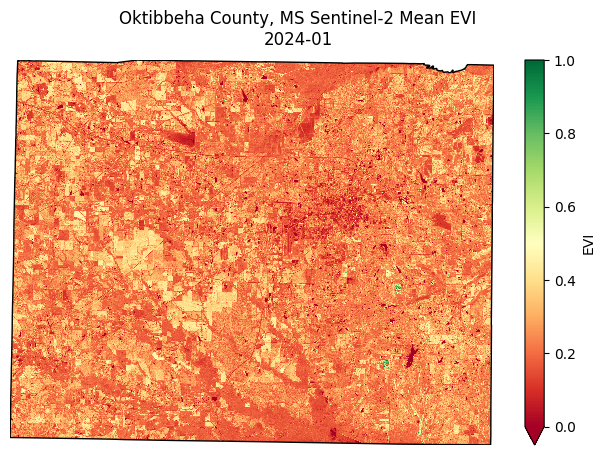

In [7]:
fig, ax = plt.subplots(figsize=(8, 5))

# set appropriate values for visualization
vmin = 0
vmax = 1

def update(frame):
    ax.clear()
    monthly_evi.isel(time=frame).plot.imshow(
        ax=ax, add_colorbar=False, cmap='RdYlGn', vmin=vmin, vmax=vmax
    )

    ax.set_title(None)
    ax.set_aspect('equal')
    ax.axis('off')
    x_lim, ylim = ax.get_xlim(), ax.get_ylim()
    okt_gdf.boundary.plot(ax=ax, color='black', linewidth=1)
    
    ax.set_xlim(x_lim)
    ax.set_ylim(ylim)
    
    fig.suptitle(f"Oktibbeha County, MS Sentinel-2 Mean EVI\n" + \
        f"{monthly_evi['time'][frame].dt.strftime('%Y-%m').values}")
    
init_plot = monthly_evi.isel(time=0).plot.imshow(
    ax=ax, add_colorbar=True, cbar_kwargs={'label': 'EVI'},cmap='RdYlGn', vmin=vmin, vmax=vmax
)

ani = FuncAnimation(fig, update, frames=len(monthly_evi['time']), repeat=False)

# show in notebook
HTML(ani.to_jshtml(fps=1, default_mode='once')) 